In [196]:
from sklearn.decomposition import TruncatedSVD
from scipy.sparse.linalg import svds

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [197]:
# user_perfume_data = pd.merge(rating_data, perfume_data, on='perfumeId')
user_perfume_data = pd.read_csv("./user_review_jiho.csv")
user_perfume_data.head()

,userId,title,rating
0,0,lime basil & mandarin jomalone,5.0
1,0,warm cotton clean,4.0
2,0,blackberry & bay jomalone,4.0
3,0,gypsy water byredo,5.0
4,0,mojave ghost byredo,2.0


In [198]:
user_perfume_data.shape


(444, 3)

In [199]:
user_perfume_rating = user_perfume_data.pivot_table('rating', index = 'userId', columns='title').fillna(0)


In [200]:
user_perfume_rating.shape

(39, 260)

In [201]:
user_perfume_rating.head()

title,34 boulevard saint germain diptyque,4711 acqua colonia blood orange & basil 4711,a la rose maison francis kurkdjian,agar musk ramon monegal,alizarin penhaligon's,amazing grace ballet rose philosophy,amazing grace philosophy,amber musk aerin lauder,american cream lush,angeli di firenze santa maria novella,...,white suede tom ford,white tea elizabeth arden,wild bluebell jomalone,wood sage & sea salt,wood sage & sea salt jomalone,레이디 고디바 향기의 미술관,은은한 비누 paffem,잔느 사마리의 초상 향기의미술관,코튼키스 포맨트,코튼허그 포맨트
userId,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0


In [202]:
perfume_user_rating = user_perfume_rating.values.T
perfume_user_rating.shape

(260, 39)

In [203]:
type(perfume_user_rating)

numpy.ndarray

In [204]:
SVD = TruncatedSVD(n_components=12)
matrix = SVD.fit_transform(perfume_user_rating)
matrix.shape

(260, 12)

In [205]:
matrix[0]

array([ 0.21599928,  0.97726077,  0.69681125,  0.20487897,  0.99710573,
       -2.141521  ,  1.11467398,  0.0340923 ,  0.49950668, -0.04581448,
       -0.14993813,  0.28520724])

In [206]:
corr = np.corrcoef(matrix)
corr.shape

(260, 260)

In [207]:
corr2 = corr[:200, :200]
corr2.shape

(200, 200)

<AxesSubplot:>

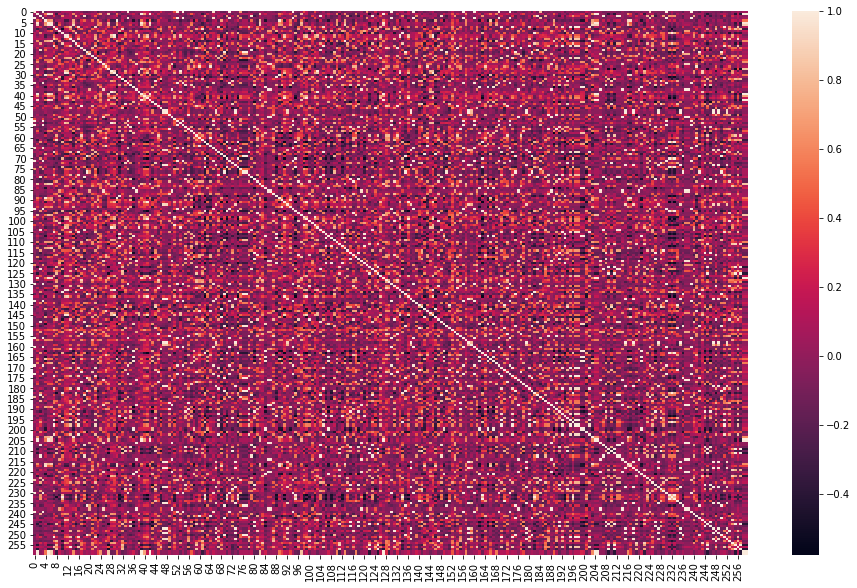

In [208]:
plt.figure(figsize=(16, 10))
sns.heatmap(corr)

In [209]:
perfume_title = user_perfume_rating.columns
perfume_title_list = list(perfume_title)
coffey_hands = perfume_title_list.index("eau triple lichen d'ecosse buly 1803")

['a la rose maison francis kurkdjian',
 'bergamote 22 le labo',
 "eau triple lichen d'ecosse buly 1803",
 'geranium odorata eau de toilette diptyque',
 'jasmin 17 le labo',
 'lime basil & mandarin jomalone',
 'oud maison francis kurkdjian',
 'rose 31 le labo',
 "rose of no man's land byredo",
 'rose pompon eau de toilette annick goutal',
 'tam dao eau de toilette diptyque']

In [210]:
corr_coffey_hands = corr[coffey_hands]
list(perfume_title[(corr_coffey_hands >= 0.9)])

['a la rose maison francis kurkdjian',
 'bergamote 22 le labo',
 "eau triple lichen d'ecosse buly 1803",
 'geranium odorata eau de toilette diptyque',
 'jasmin 17 le labo',
 'lime basil & mandarin jomalone',
 'oud maison francis kurkdjian',
 'rose 31 le labo',
 "rose of no man's land byredo",
 'rose pompon eau de toilette annick goutal']

In [211]:
df_user_perfume_rating = user_perfume_data.pivot_table('rating', index = 'userId', columns='title').fillna(0)

In [212]:
df_user_perfume_rating.head()

title,34 boulevard saint germain diptyque,4711 acqua colonia blood orange & basil 4711,a la rose maison francis kurkdjian,agar musk ramon monegal,alizarin penhaligon's,amazing grace ballet rose philosophy,amazing grace philosophy,amber musk aerin lauder,american cream lush,angeli di firenze santa maria novella,...,white suede tom ford,white tea elizabeth arden,wild bluebell jomalone,wood sage & sea salt,wood sage & sea salt jomalone,레이디 고디바 향기의 미술관,은은한 비누 paffem,잔느 사마리의 초상 향기의미술관,코튼키스 포맨트,코튼허그 포맨트
userId,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0


In [213]:
matrix = df_user_perfume_rating.values

user_ratings_mean = np.mean(matrix, axis =1)

matrix_user_mean =matrix-user_ratings_mean.reshape(-1,1)

In [214]:
matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [215]:
matrix.shape

(39, 260)

In [216]:
user_ratings_mean.shape

(39,)

In [217]:
pd.DataFrame(matrix_user_mean, columns=df_user_perfume_rating.columns).head()

title,34 boulevard saint germain diptyque,4711 acqua colonia blood orange & basil 4711,a la rose maison francis kurkdjian,agar musk ramon monegal,alizarin penhaligon's,amazing grace ballet rose philosophy,amazing grace philosophy,amber musk aerin lauder,american cream lush,angeli di firenze santa maria novella,...,white suede tom ford,white tea elizabeth arden,wild bluebell jomalone,wood sage & sea salt,wood sage & sea salt jomalone,레이디 고디바 향기의 미술관,은은한 비누 paffem,잔느 사마리의 초상 향기의미술관,코튼키스 포맨트,코튼허그 포맨트
0,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,...,-0.107692,-0.107692,-0.107692,-0.107692,4.892308,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692
1,-0.153846,-0.153846,-0.153846,-0.153846,2.846154,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,...,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846
2,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,...,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000
3,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,...,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,2.826923,-0.173077,-0.173077,-0.173077
4,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,...,-0.207692,-0.207692,-0.207692,-0.207692,3.792308,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692


In [218]:
U, sigma, Vt = svds(matrix_user_mean, k=17)

In [219]:
print(U.shape)
print(sigma.shape)
print(Vt.shape)

(39, 17)
(17,)
(17, 260)


In [220]:
sigma = np.diag(sigma)

In [221]:
sigma.shape

(17, 17)

In [222]:
svd_user_predicted_ratings = np.dot(np.dot(U, sigma), Vt) + user_ratings_mean.reshape(-1, 1)

In [223]:
df_svd_preds = pd.DataFrame(svd_user_predicted_ratings, columns = df_user_perfume_rating.columns)
# df_svd_preds.iloc[36]

In [224]:
def recommend_perfumes(df_svd_preds, user_perfume_data, user_id, num_recommendations=10):
    user_row_number = user_id
    sorted_user_predictions = df_svd_preds.iloc[user_row_number].sort_values(ascending=False)
    user_history = user_perfume_data[user_perfume_data.userId == user_id].sort_values(['rating'], ascending=False)
    recommendations = user_perfume_data[~user_perfume_data['title'].isin(user_history['title'])]
    recommendations = recommendations.merge( pd.DataFrame(sorted_user_predictions).reset_index(), on = 'title')
    recommendations = recommendations.rename(columns = {user_row_number: 'Predictions'}).sort_values('Predictions', ascending = False)
    recommendations.reset_index(inplace=True)
    recommendations.drop(["userId", "rating", "index"], axis=1,inplace=True)
    recommendations.drop_duplicates(inplace=True)
    recommendations = recommendations.iloc[:num_recommendations, :]
    return user_history, recommendations

In [225]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 36, 10)

In [226]:
already_rated.head(10)

,userId,title,rating
430,36,tacit aesop,5.0
432,36,touch for men burberry,5.0
433,36,dirty lush,5.0
429,36,jazz club maison martin margiela,3.0
431,36,hwyl aesop,3.0
434,36,blanche byredo,2.0


In [227]:
predictions

,title,Predictions
0,baccarat rouge 540 maison francis kurkdjian,1.081803
2,orphéon diptyque,0.731326
3,un jardin apres la mousson hermès,0.731326
4,jasmin 17 le labo,0.662729
6,inlé memo paris,0.614485
8,eclat d'arpege pour homme lanvin,0.601259
14,l'eau d'hiver frederic malle,0.596797
15,angels' share by kilian,0.596797
16,wood sage & sea salt jomalone,0.557986
25,chloe eau de parfum chloé,0.516828


In [228]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 37, 10)

In [229]:
already_rated.head(10)

,userId,title,rating
437,37,english pear & fressia jomalone,5.0
435,37,miss dior blooming bouquet christian dior,4.0
436,37,tam dao eau de toilette diptyque,4.0
438,37,blackberry & bay jomalone,2.0


In [230]:
predictions


,title,Predictions
0,incanto charms salvatore ferragamo,1.005961
5,eau rose eau de toilette diptyque,0.801089
7,wild bluebell jomalone,0.708096
9,blanche byredo,0.675072
18,jeanne lanvin lanvin,0.658334
22,marry me lanvin,0.645192
26,replica flower market maison margiela,0.483023
27,bombshell dani mackenzie,0.483006
29,le jardin de monsieur li hermès,0.464028
31,eau des sens eau de toilette diptyque,0.452919


In [231]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 38, 10)

In [232]:
already_rated.head(10)

,userId,title,rating
440,38,ck one calvin klein,5.0
439,38,blanche byredo,4.0
442,38,warm cotton clean,4.0
441,38,jazz club maison martin margiela,3.0
443,38,ferrari light essence ferrari,3.0


In [233]:
predictions


,title,Predictions
0,wood sage & sea salt jomalone,1.457188
9,artisan john varvatos,1.279358
13,light blue dolce&gabbana,1.094339
16,eclat d’arpège lanvin,0.746694
18,kenzo pour homme kenzo,0.640614
19,chance eau de toilette chanel,0.640614
20,eclat d'arpege pour homme lanvin,0.594997
26,eau des sens eau de toilette diptyque,0.537962
30,coco mademoiselle chanel,0.508567
33,artisan blu john varvatos,0.482428
